<font size="4" color="blue"><b>Problem Statement<b><font><br>
<font size="2" font-family: Arial color="black"><b>
A bank had collected data about historical loan default along with respective information for each member. 
We need to build a model that will help this bank by predicting the probability that a member will default.
<font>

In [77]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
from scipy import stats

import warnings
warnings.filterwarnings('ignore')

In [78]:
df_1 = pd.read_csv("D:/ML Projects/Loan Default Probability/train_data_1.csv")
df_2 = pd.read_csv("D:/ML Projects/Loan Default Probability/train_data_2.csv")
df = pd.concat([df_1,df_2],axis=0)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 532428 entries, 0 to 262427
Data columns (total 45 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   member_id                    532428 non-null  int64  
 1   loan_amnt                    532428 non-null  int64  
 2   funded_amnt                  532428 non-null  int64  
 3   funded_amnt_inv              532428 non-null  float64
 4   term                         532428 non-null  object 
 5   batch_enrolled               341200 non-null  object 
 6   int_rate                     532428 non-null  float64
 7   grade                        532428 non-null  object 
 8   sub_grade                    532428 non-null  object 
 9   emp_title                    501595 non-null  object 
 10  emp_length                   505537 non-null  object 
 11  home_ownership               532428 non-null  object 
 12  annual_inc                   532425 non-null  float64
 13 

In [4]:
df.head().transpose()

,0,1,2,3,4
member_id,58189336,70011223,70255675,1893936,7652106
loan_amnt,14350,4800,10000,15000,16000
funded_amnt,14350,4800,10000,15000,16000
funded_amnt_inv,14350.0,4800.0,10000.0,15000.0,16000.0
term,36 months,36 months,36 months,36 months,36 months
batch_enrolled,NaN,BAT1586599,BAT1586599,BAT4808022,BAT2833642
int_rate,19.19,10.99,7.26,19.72,10.64
grade,E,B,A,D,B
sub_grade,E3,B4,A4,D5,B2
emp_title,clerk,Human Resources Specialist,Driver,Us office of Personnel Management,LAUSD-HOLLYWOOD HIGH SCHOOL


In [5]:
#Checking is there any discrepencies b/w before & after concatenation
print('shape of {} is {}'.format('train1',df_1.shape))
print('shape of {} is {}'.format('train2',df_2.shape))
print('shape of {} is {}'.format('df',df.shape))

shape of train1 is (270000, 45)
shape of train2 is (262428, 45)
shape of df is (532428, 45)


In [6]:
df.describe()

,member_id,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,annual_inc,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,...,total_rec_late_fee,recoveries,collection_recovery_fee,collections_12_mths_ex_med,mths_since_last_major_derog,acc_now_delinq,tot_coll_amt,tot_cur_bal,total_rev_hi_lim,loan_status
count,5.324280e+05,532428.000000,532428.000000,532428.000000,532428.000000,5.324250e+05,532428.000000,532412.000000,532412.000000,259874.000000,...,532428.000000,532428.000000,532428.000000,532333.000000,132980.000000,532412.000000,490424.000000,4.904240e+05,4.904240e+05,532428.000000
mean,3.500547e+07,14757.595722,14744.271291,14704.926696,13.242969,7.502984e+04,18.138767,0.314448,0.694603,34.055735,...,0.394954,45.717832,4.859221,0.014299,44.121462,0.005015,213.562222,1.395541e+05,3.208057e+04,0.236327
std,2.412148e+07,8434.420080,8429.139277,8441.290381,4.379611,6.519985e+04,8.369074,0.860045,0.997025,21.884797,...,4.091546,409.647467,63.123361,0.133005,22.198410,0.079117,1958.571538,1.539149e+05,3.805304e+04,0.424826
min,7.047300e+04,500.000000,500.000000,0.000000,5.320000,1.200000e+03,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000
25%,1.086688e+07,8000.000000,8000.000000,8000.000000,9.990000,4.500000e+04,11.930000,0.000000,0.000000,15.000000,...,0.000000,0.000000,0.000000,0.000000,27.000000,0.000000,0.000000,2.983975e+04,1.400000e+04,0.000000
50%,3.709590e+07,13000.000000,13000.000000,13000.000000,12.990000,6.500000e+04,17.650000,0.000000,0.000000,31.000000,...,0.000000,0.000000,0.000000,0.000000,44.000000,0.000000,0.000000,8.066950e+04,2.370000e+04,0.000000
75%,5.848920e+07,20000.000000,20000.000000,20000.000000,16.200000,9.000000e+04,23.950000,0.000000,1.000000,50.000000,...,0.000000,0.000000,0.000000,0.000000,61.000000,0.000000,0.000000,2.084792e+05,3.980000e+04,0.000000
max,7.354484e+07,35000.000000,35000.000000,35000.000000,28.990000,9.500000e+06,672.520000,30.000000,31.000000,180.000000,...,358.680000,33520.270000,7002.190000,16.000000,180.000000,14.000000,496651.000000,8.000078e+06,9.999999e+06,1.000000


As there are difference between the values of mean & median, the data is not normally distributed.

<AxesSubplot:xlabel='loan_status', ylabel='count'>

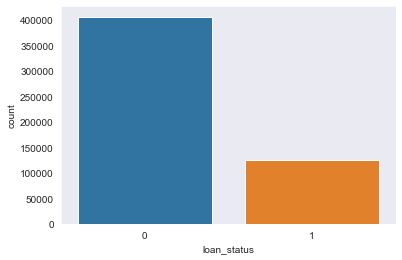

In [7]:
sns.set_style('dark')
sns.countplot(x='loan_status',data=df)

In [8]:
df['loan_status'].value_counts()

0    406601
1    125827
Name: loan_status, dtype: int64

The dataset is a mildly imbalanced dataset, since the difference b/w 0 & 1 is 3/4th.

In [79]:
df_num = df.select_dtypes(include=['float64', 'int64'])

In [10]:
df_num.head()

,member_id,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,annual_inc,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,...,total_rec_late_fee,recoveries,collection_recovery_fee,collections_12_mths_ex_med,mths_since_last_major_derog,acc_now_delinq,tot_coll_amt,tot_cur_bal,total_rev_hi_lim,loan_status
0,58189336,14350,14350,14350.0,19.19,28700.0,33.88,0.0,1.0,50.0,...,0.0,0.0,0.0,0.0,74.0,0.0,0.0,28699.0,30800.0,0
1,70011223,4800,4800,4800.0,10.99,65000.0,3.64,0.0,1.0,NaN,...,0.0,0.0,0.0,0.0,NaN,0.0,0.0,9974.0,32900.0,0
2,70255675,10000,10000,10000.0,7.26,45000.0,18.42,0.0,0.0,NaN,...,0.0,0.0,0.0,0.0,NaN,0.0,65.0,38295.0,34900.0,0
3,1893936,15000,15000,15000.0,19.72,105000.0,14.97,0.0,2.0,46.0,...,0.0,0.0,0.0,0.0,NaN,0.0,0.0,55564.0,24700.0,0
4,7652106,16000,16000,16000.0,10.64,52000.0,20.16,0.0,0.0,NaN,...,0.0,0.0,0.0,0.0,NaN,0.0,0.0,47159.0,47033.0,0


In [11]:
data_list = []
for x in df_num:
    if df_num[x].isnull().sum() > 0:
        data_list.append({'Column':x,'null_sum':df_num[x].isnull().sum()
                          ,'null_percent':round((df_num[x].isnull().sum()/532428)*100,2)})

datafr=pd.DataFrame(data_list)
print(datafr)

                         Column  null_sum  null_percent
0                    annual_inc         3          0.00
1                   delinq_2yrs        16          0.00
2                inq_last_6mths        16          0.00
3        mths_since_last_delinq    272554         51.19
4        mths_since_last_record    450305         84.58
5                      open_acc        16          0.00
6                       pub_rec        16          0.00
7                    revol_util       287          0.05
8                     total_acc        16          0.00
9    collections_12_mths_ex_med        95          0.02
10  mths_since_last_major_derog    399448         75.02
11               acc_now_delinq        16          0.00
12                 tot_coll_amt     42004          7.89
13                  tot_cur_bal     42004          7.89
14             total_rev_hi_lim     42004          7.89


In [12]:
#dropping all the columns which has more than 40% of null values
df_num = df_num.drop(['member_id', 'mths_since_last_delinq','mths_since_last_record','mths_since_last_major_derog'], axis=1)

In [13]:
data_list = []
for x in df_num:
    if df_num[x].isnull().sum() > 0:
        data_list.append({'Column':x,'null_sum':df_num[x].isnull().sum()
                          ,'null_percent':round((df_num[x].isnull().sum()/532428)*100,2)})

datafr=pd.DataFrame(data_list)
print(datafr)

                        Column  null_sum  null_percent
0                   annual_inc         3          0.00
1                  delinq_2yrs        16          0.00
2               inq_last_6mths        16          0.00
3                     open_acc        16          0.00
4                      pub_rec        16          0.00
5                   revol_util       287          0.05
6                    total_acc        16          0.00
7   collections_12_mths_ex_med        95          0.02
8               acc_now_delinq        16          0.00
9                 tot_coll_amt     42004          7.89
10                 tot_cur_bal     42004          7.89
11            total_rev_hi_lim     42004          7.89


only 5 columns have null values less than 10% which can be treatable

In [14]:
#Filling null values with median cz the distribution is not normal
for x in df_num.columns:
    if df_num[x].isnull().sum() > 0 :
        df_num[x].fillna(df_num[x].median(), inplace=True)
#df_num.isnull().sum()

missing = df_num.isnull().sum()
missing = pd.DataFrame(missing[missing!=0])
missing.columns = ['No. of missing values']
missing['Percentage'] = 100*missing['No. of missing values']/df_num.shape[0]
missing.sort_values(by="Percentage", ascending=False)

,No. of missing values,Percentage


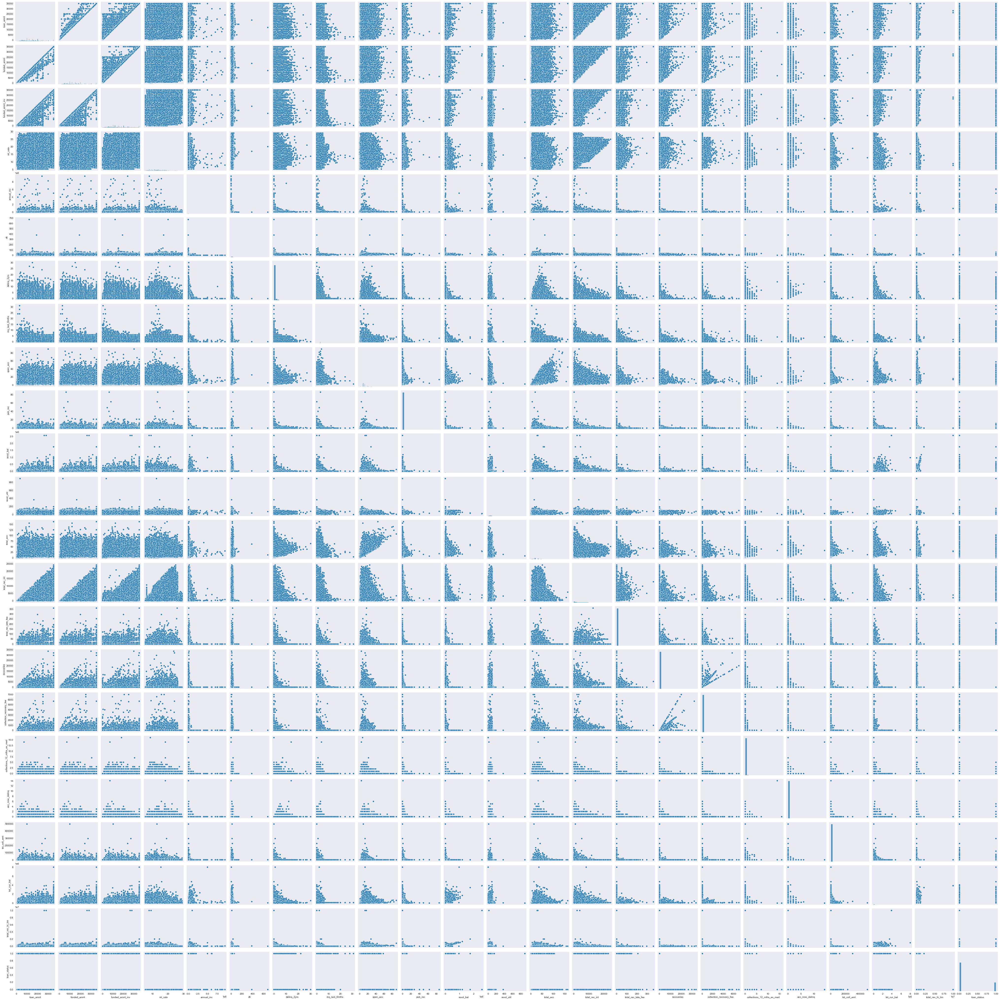

In [15]:
sns.pairplot(df_num)

In [80]:
df_Cat = df.select_dtypes(include=['object'])
df_Cat.head().transpose()

,0,1,2,3,4
term,36 months,36 months,36 months,36 months,36 months
batch_enrolled,NaN,BAT1586599,BAT1586599,BAT4808022,BAT2833642
grade,E,B,A,D,B
sub_grade,E3,B4,A4,D5,B2
emp_title,clerk,Human Resources Specialist,Driver,Us office of Personnel Management,LAUSD-HOLLYWOOD HIGH SCHOOL
emp_length,9 years,< 1 year,2 years,10+ years,10+ years
home_ownership,OWN,MORTGAGE,OWN,RENT,RENT
verification_status,Source Verified,Source Verified,Not Verified,Not Verified,Verified
pymnt_plan,n,n,n,n,n
desc,NaN,NaN,NaN,> My goal is to obtain a loan to pay off my hi...,NaN


In [16]:
cat_list = []
for x in df_Cat:
    if df_Cat[x].isnull().sum() > 0:
        cat_list.append({'Column':x,'null_sum':df_Cat[x].isnull().sum()
                          ,'null_percent':round((df_Cat[x].isnull().sum()/532428)*100,2)})

datafr=pd.DataFrame(cat_list)
datafr

,Column,null_sum,null_percent
0,batch_enrolled,191228,35.92
1,emp_title,30833,5.79
2,emp_length,26891,5.05
3,desc,456829,85.80
4,title,90,0.02
5,verification_status_joint,532123,99.94


In [17]:
df_Cat['batch_enrolled'].value_counts()

BAT2252229    18791
BAT3873588    17839
BAT2803411    17111
BAT2078974    14859
BAT1586599    14463
              ...  
BAT4347689       30
BAT4884699       29
BAT5869156       26
BAT5077496       18
BAT2331079       13
Name: batch_enrolled, Length: 103, dtype: int64

In [18]:
#For batch enrolled there is no clear distinction of what should be treated as mode so dropping it.
#desc & verification_status_joint has more than 40% of null values

df_Cat = df_Cat.drop(['desc','verification_status_joint','batch_enrolled','zip_code'], axis=1)

In [19]:
#Finding mode
for x in ['emp_title','emp_length','title']:
    print('Mode for {} is {}'.format(x,df_Cat[x].mode()))

Mode for emp_title is 0    Teacher
dtype: object
Mode for emp_length is 0    10+ years
dtype: object
Mode for title is 0    Debt consolidation
dtype: object


In [20]:
#Treating missing values with Mode
key = ['emp_title','emp_length','title']
val = ['Teacher','10+ years','Debt consolidation']
for i in [0,1,2]:
    df_Cat[key[i]].fillna(val[i],inplace=True)

df_Cat.isnull().sum()

term                   0
grade                  0
sub_grade              0
emp_title              0
emp_length             0
home_ownership         0
verification_status    0
pymnt_plan             0
purpose                0
title                  0
addr_state             0
initial_list_status    0
application_type       0
last_week_pay          0
dtype: int64

In [21]:
df_Cat.nunique()

term                        2
grade                       7
sub_grade                  35
emp_title              190124
emp_length                 11
home_ownership              6
verification_status         3
pymnt_plan                  2
purpose                    14
title                   39693
addr_state                 51
initial_list_status         2
application_type            2
last_week_pay              98
dtype: int64

In [22]:
#extracting only int values from the following columns

cols = ['term','last_week_pay','emp_length'] 
for x in cols:
    df_Cat[x] = df_Cat[x].str.extract('(\d*\.?\d+)', expand=True)

df_Cat.head()

,term,grade,sub_grade,emp_title,emp_length,home_ownership,verification_status,pymnt_plan,purpose,title,addr_state,initial_list_status,application_type,last_week_pay
0,36,E,E3,clerk,9,OWN,Source Verified,n,debt_consolidation,Debt consolidation,FL,f,INDIVIDUAL,26
1,36,B,B4,Human Resources Specialist,1,MORTGAGE,Source Verified,n,home_improvement,Home improvement,MD,w,INDIVIDUAL,9
2,36,A,A4,Driver,2,OWN,Not Verified,n,debt_consolidation,Debt consolidation,OH,w,INDIVIDUAL,9
3,36,D,D5,Us office of Personnel Management,10,RENT,Not Verified,n,debt_consolidation,Debt consolidation,VA,f,INDIVIDUAL,135
4,36,B,B2,LAUSD-HOLLYWOOD HIGH SCHOOL,10,RENT,Verified,n,credit_card,refi,CA,w,INDIVIDUAL,96


In [23]:
#Applying Label Encoding for object to numeric conversion

objList = ['grade','sub_grade']
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

for x in objList:
    df_Cat[x] = le.fit_transform(df_Cat[x])
df_Cat.head()

,term,grade,sub_grade,emp_title,emp_length,home_ownership,verification_status,pymnt_plan,purpose,title,addr_state,initial_list_status,application_type,last_week_pay
0,36,4,22,clerk,9,OWN,Source Verified,n,debt_consolidation,Debt consolidation,FL,f,INDIVIDUAL,26
1,36,1,8,Human Resources Specialist,1,MORTGAGE,Source Verified,n,home_improvement,Home improvement,MD,w,INDIVIDUAL,9
2,36,0,3,Driver,2,OWN,Not Verified,n,debt_consolidation,Debt consolidation,OH,w,INDIVIDUAL,9
3,36,3,19,Us office of Personnel Management,10,RENT,Not Verified,n,debt_consolidation,Debt consolidation,VA,f,INDIVIDUAL,135
4,36,1,6,LAUSD-HOLLYWOOD HIGH SCHOOL,10,RENT,Verified,n,credit_card,refi,CA,w,INDIVIDUAL,96


In [24]:
df_Cat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 532428 entries, 0 to 262427
Data columns (total 14 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   term                 532428 non-null  object
 1   grade                532428 non-null  int32 
 2   sub_grade            532428 non-null  int32 
 3   emp_title            532428 non-null  object
 4   emp_length           532428 non-null  object
 5   home_ownership       532428 non-null  object
 6   verification_status  532428 non-null  object
 7   pymnt_plan           532428 non-null  object
 8   purpose              532428 non-null  object
 9   title                532428 non-null  object
 10  addr_state           532428 non-null  object
 11  initial_list_status  532428 non-null  object
 12  application_type     532428 non-null  object
 13  last_week_pay        521814 non-null  object
dtypes: int32(2), object(12)
memory usage: 73.0+ MB


In [25]:
#Converting the cols from object to int
cols.extend(objList)
cols


['term', 'last_week_pay', 'emp_length', 'grade', 'sub_grade']

In [26]:
for x in cols:
    df_Cat[x] = pd.to_numeric(df_Cat[x])

In [27]:
df_Cat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 532428 entries, 0 to 262427
Data columns (total 14 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   term                 532428 non-null  int64  
 1   grade                532428 non-null  int32  
 2   sub_grade            532428 non-null  int32  
 3   emp_title            532428 non-null  object 
 4   emp_length           532428 non-null  int64  
 5   home_ownership       532428 non-null  object 
 6   verification_status  532428 non-null  object 
 7   pymnt_plan           532428 non-null  object 
 8   purpose              532428 non-null  object 
 9   title                532428 non-null  object 
 10  addr_state           532428 non-null  object 
 11  initial_list_status  532428 non-null  object 
 12  application_type     532428 non-null  object 
 13  last_week_pay        521814 non-null  float64
dtypes: float64(1), int32(2), int64(2), object(9)
memory usage: 73.0+ MB


In [28]:
for x in df_Cat:
    if df_Cat[x].isnull().sum() > 0:
        print('{}         - {}  {:.2f}%'.format(x,df_Cat[x].isnull().sum(),(df_Cat[x].isnull().sum()/532428)*100))

last_week_pay         - 10614  1.99%


In [29]:
#Treating the missing value with mode
df_Cat['last_week_pay'].fillna(df_Cat['last_week_pay'].mode()[0],inplace=True)

In [30]:
for x in df_Cat:
    if df_Cat[x].isnull().sum() > 0:
        print('{} - {}  {:.2f}%'.format(x,df_Cat[x].isnull().sum(),(df_Cat[x].isnull().sum()/532428)*100))

#There is no missing value in last_week_pay

In [31]:
df_Cat.nunique()

term                        2
grade                       7
sub_grade                  35
emp_title              190124
emp_length                 10
home_ownership              6
verification_status         3
pymnt_plan                  2
purpose                    14
title                   39693
addr_state                 51
initial_list_status         2
application_type            2
last_week_pay              97
dtype: int64

In [32]:
df_Cat['last_week_pay'].value_counts()

13.0     40947
9.0      28626
26.0     27475
22.0     26000
4.0      25704
         ...  
300.0        1
283.0        1
269.0        1
304.0        1
278.0        1
Name: last_week_pay, Length: 97, dtype: int64

In [33]:
df_Cat['sub_grade'].value_counts()

7     33844
8     33198
10    31975
11    31356
12    30080
6     29390
9     29313
13    29103
4     27016
5     26968
14    24985
15    21712
3     20823
16    17991
17    15771
18    15226
2     14082
0     13653
1     13533
19    12867
20    10928
21    10255
22     8488
23     7051
24     5773
25     4350
26     3196
27     2708
28     2056
29     1516
30     1112
31      824
32      559
33      391
34      335
Name: sub_grade, dtype: int64

In [34]:
df_Cat['addr_state'].value_counts()

CA    77911
NY    44406
TX    42527
FL    36575
IL    21205
NJ    20103
PA    18882
OH    17778
GA    17292
VA    15826
NC    14812
MI    13869
MD    12667
MA    12385
AZ    12320
WA    11664
CO    11233
MN     9577
MO     8538
IN     8197
CT     8075
TN     7817
NV     7408
WI     6880
AL     6699
OR     6549
SC     6331
LA     6304
KY     5140
KS     4818
OK     4797
AR     3988
UT     3829
NM     2958
HI     2705
WV     2615
NH     2568
RI     2322
MS     2296
MT     1545
DE     1512
DC     1477
AK     1346
WY     1198
SD     1091
VT     1062
NE      709
ME      324
ND      284
IA        7
ID        7
Name: addr_state, dtype: int64

In [35]:
df_Cat['purpose'].value_counts()

debt_consolidation    314989
credit_card           123670
home_improvement       31087
other                  25652
major_purchase         10284
small_business          6146
car                     5266
medical                 5117
moving                  3243
vacation                2812
house                   2170
wedding                 1401
renewable_energy         331
educational              260
Name: purpose, dtype: int64

In [36]:
df_Cat['title'].value_counts().nlargest(10)

Debt consolidation         249057
Credit card refinancing     98582
Home improvement            24057
Other                       19053
Debt Consolidation           9932
Major purchase               7195
Medical expenses             3997
Business                     3962
Consolidation                3354
Car financing                3333
Name: title, dtype: int64

In [37]:
df_Cat['emp_title'].value_counts().nlargest(10)

Teacher             39113
Manager              6922
Registered Nurse     3387
Owner                3305
RN                   3255
Supervisor           3215
Sales                2668
Project Manager      2473
Office Manager       2189
Driver               2187
Name: emp_title, dtype: int64

In [38]:
#Creating one hot encoding for max occurence
#creating the indicators with titles with maximum occurance

df_Cat['emp_titl_teacher']=np.where(df_Cat['emp_title']=='teacher',1,0)
df_Cat['emp_titl_manager']=np.where(df_Cat['emp_title']=='manager',1,0)
df_Cat['title_Debt_consolidation']=np.where(df_Cat['title']=='Debt consolidation',1,0)
df_Cat['title_Credit_card_refinancing']=np.where(df_Cat['title']=='Credit card refinancing',1,0)


In [39]:
df_Cat = df_Cat.drop([ 'emp_title','title'], axis=1)

In [40]:
df_Cat.head()

,term,grade,sub_grade,emp_length,home_ownership,verification_status,pymnt_plan,purpose,addr_state,initial_list_status,application_type,last_week_pay,emp_titl_teacher,emp_titl_manager,title_Debt_consolidation,title_Credit_card_refinancing
0,36,4,22,9,OWN,Source Verified,n,debt_consolidation,FL,f,INDIVIDUAL,26.0,0,0,1,0
1,36,1,8,1,MORTGAGE,Source Verified,n,home_improvement,MD,w,INDIVIDUAL,9.0,0,0,0,0
2,36,0,3,2,OWN,Not Verified,n,debt_consolidation,OH,w,INDIVIDUAL,9.0,0,0,1,0
3,36,3,19,10,RENT,Not Verified,n,debt_consolidation,VA,f,INDIVIDUAL,135.0,0,0,1,0
4,36,1,6,10,RENT,Verified,n,credit_card,CA,w,INDIVIDUAL,96.0,0,0,0,0


In [81]:
#Applying One Hot Encoding for categorical features

df_Cat=pd.get_dummies(df_Cat, columns=['home_ownership', 'verification_status', 'pymnt_plan',
                                         'addr_state', 'initial_list_status','application_type','purpose'],drop_first=True)

In [42]:
df_Cat.describe()

,term,grade,sub_grade,emp_length,last_week_pay,emp_titl_teacher,emp_titl_manager,title_Debt_consolidation,title_Credit_card_refinancing,home_ownership_MORTGAGE,...,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding
count,532428.000000,532428.000000,532428.000000,532428.000000,532428.000000,532428.000000,532428.000000,532428.000000,532428.000000,532428.000000,...,532428.000000,532428.000000,532428.000000,532428.000000,532428.000000,532428.000000,532428.000000,532428.000000,532428.000000,532428.000000
mean,43.195790,1.797141,10.954745,6.291410,57.200489,0.003317,0.003694,0.467776,0.185156,0.499485,...,0.058387,0.004076,0.019315,0.009611,0.006091,0.048179,0.000622,0.011543,0.005281,0.002631
std,10.996354,1.312184,6.489916,3.550671,44.324033,0.057497,0.060669,0.498961,0.388424,0.500000,...,0.234474,0.063711,0.137631,0.097562,0.077807,0.214145,0.024926,0.106818,0.072482,0.051229
min,36.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,36.000000,1.000000,6.000000,3.000000,22.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,36.000000,2.000000,10.000000,7.000000,48.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,60.000000,3.000000,15.000000,10.000000,83.000000,0.000000,0.000000,1.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,60.000000,6.000000,34.000000,10.000000,304.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [43]:
df_final = pd.concat([df_num,df_Cat],axis=1)

<AxesSubplot:>

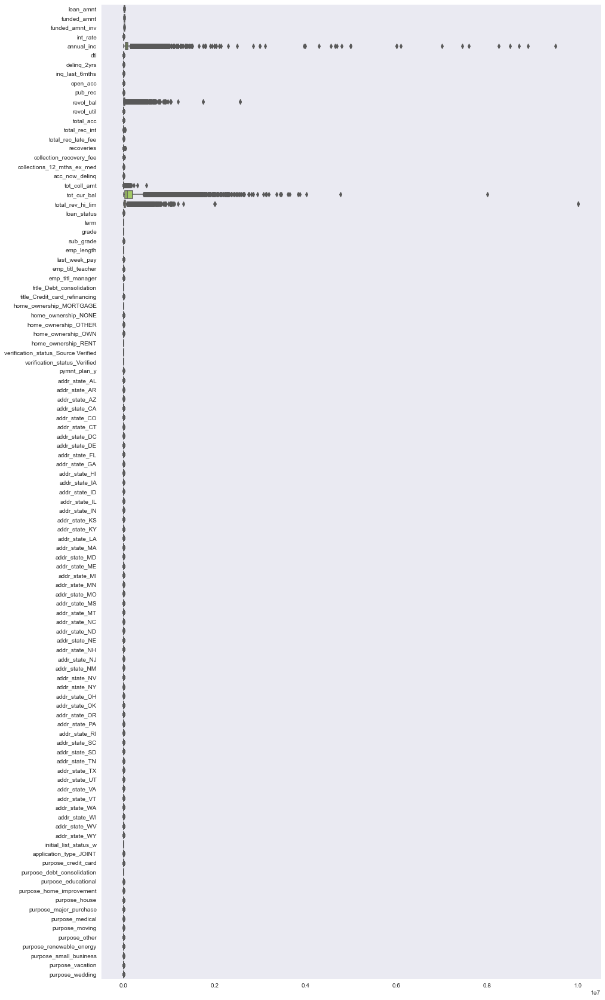

In [44]:
plt.figure(figsize=(15,30))
sns.boxplot(data=df_final, orient="h", palette="Set2")

In [45]:
df_final.head()

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,...,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding
0,14350,14350,14350.0,19.19,28700.0,33.88,0.0,1.0,14.0,1.0,...,0,0,0,0,0,0,0,0,0,0
1,4800,4800,4800.0,10.99,65000.0,3.64,0.0,1.0,6.0,0.0,...,1,0,0,0,0,0,0,0,0,0
2,10000,10000,10000.0,7.26,45000.0,18.42,0.0,0.0,5.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,15000,15000,15000.0,19.72,105000.0,14.97,0.0,2.0,10.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,16000,16000,16000.0,10.64,52000.0,20.16,0.0,0.0,11.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [47]:
from scipy import stats
skew_list = []
for i in df_final:
    skew_list.append({'Column':i,'skew':df_final[i].skew(),'max_Z-score':np.max(stats.zscore(df_final[i]))})

datafr=pd.DataFrame(skew_list)
datafr.nlargest(15,'skew')
#X,Default_ready[X].skew(),np.max(abs(stats.zscore(Default_ready[X])))

,Column,skew,max_Z-score
51,addr_state_IA,275.787185,275.790034
52,addr_state_ID,275.787185,275.790034
39,pymnt_plan_y,257.974563,257.977712
33,home_ownership_NONE,121.600781,121.608662
21,total_rev_hi_lim,80.221904,272.432980
34,home_ownership_OTHER,67.436581,67.451217
19,tot_coll_amt,64.164243,263.986225
94,purpose_educational,45.219598,45.241574
4,annual_inc,44.776336,144.555635
67,addr_state_ND,43.263814,43.286793


In [46]:
#Treating the outliers using IQR
col_sel=['sub_grade','last_week_pay','annual_inc','revol_bal','tot_coll_amt','tot_cur_bal','total_rev_hi_lim']
def iqr_capping(df1, cols, factor):
    
    for x in cols:  
        q1 = df1[x].quantile(0.25)
        q3 = df1[x].quantile(0.75)
        
        iqr = q3 - q1
        
        upper_whisker = q3 + (factor*iqr)
        lower_whisker = q1 - (factor*iqr)
        
        df1[x] = np.where(df1[x]>upper_whisker, upper_whisker,
            np.where(df1[x]<lower_whisker, lower_whisker, df1[x]))


iqr_capping(df_final, col_sel, 1.5)

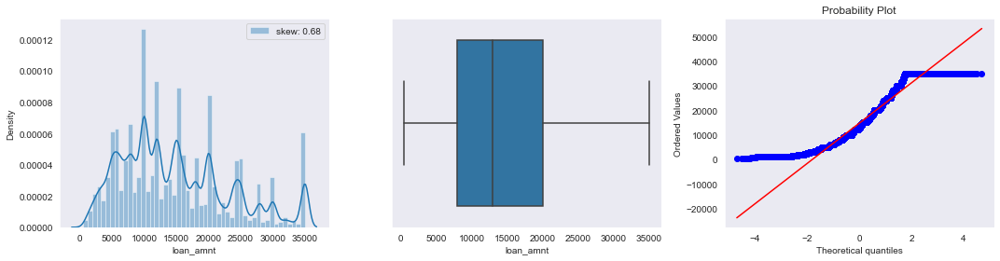

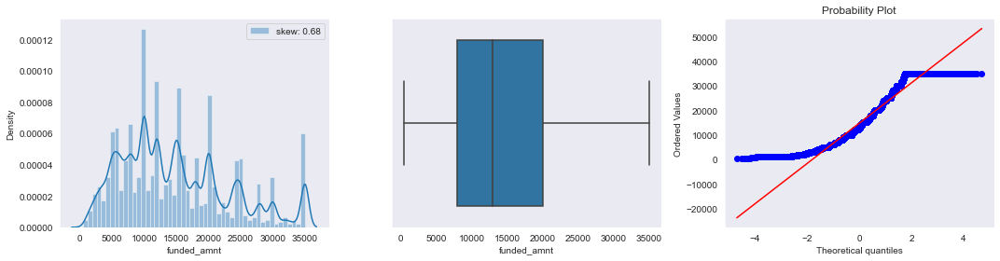

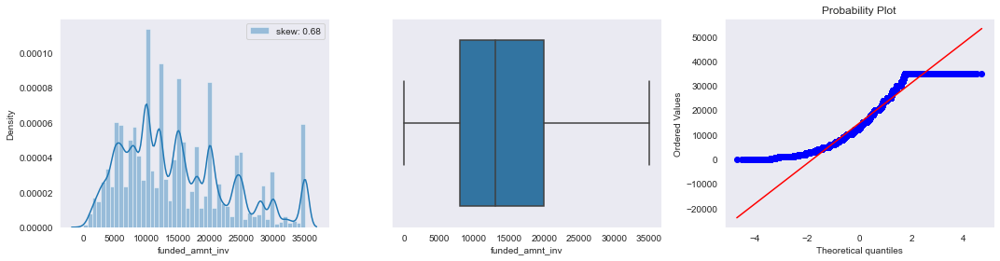

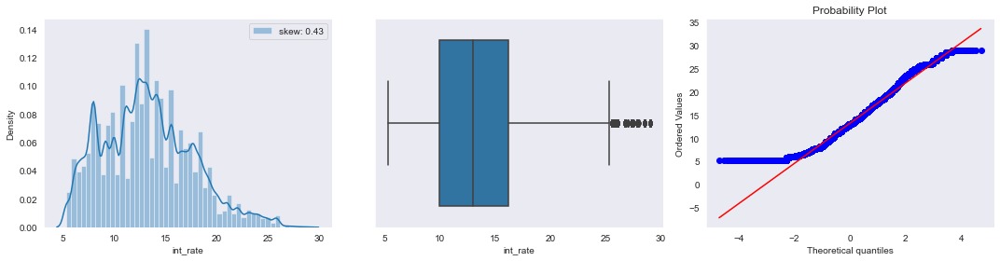

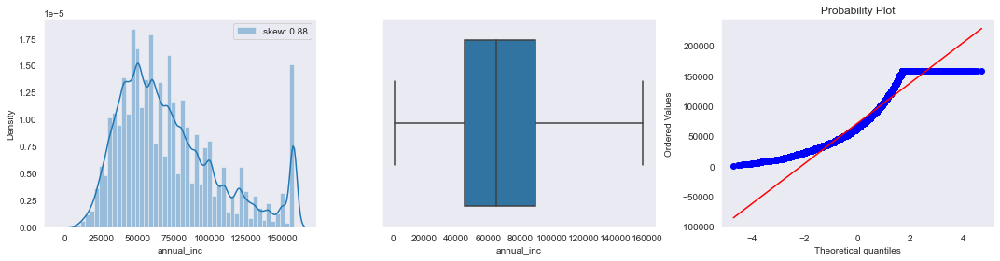

...

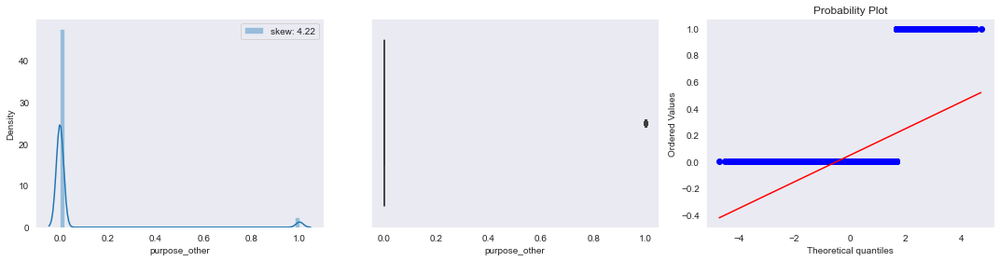

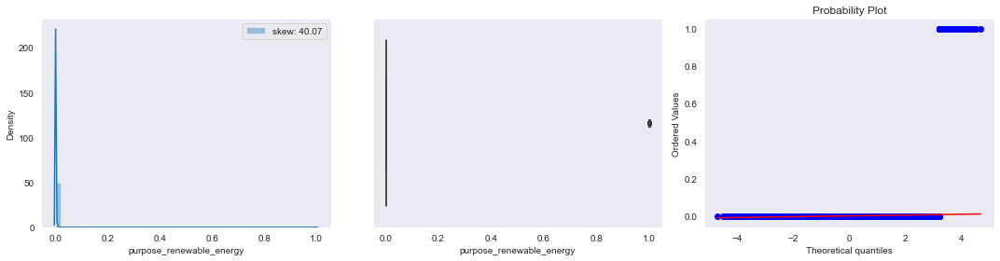

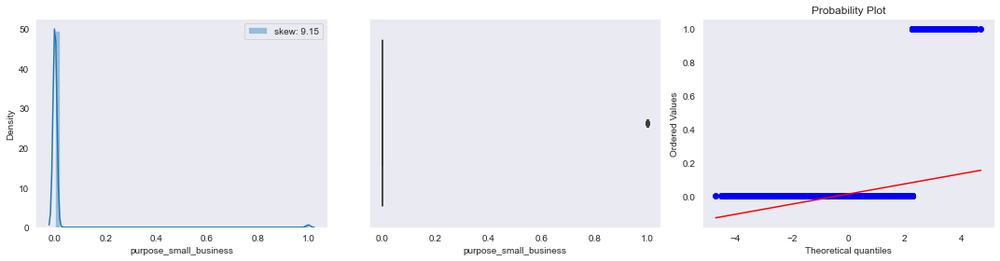

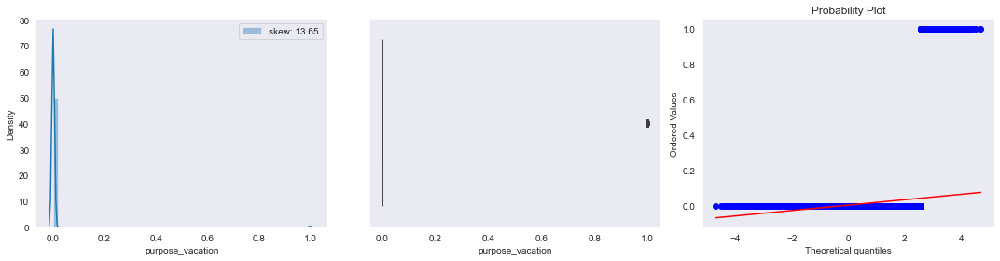

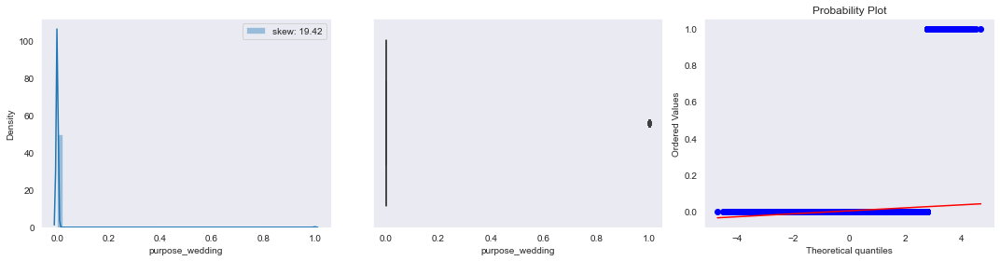

In [49]:
#Univatiate Analysis
sns.set_style('dark')
for col in df_final.describe().columns:
    plt.figure(figsize=(15,4))
    plt.subplot(131)
    sns.distplot(df_final[col], label="skew: " + str(np.round(df_final[col].skew(),2)))
    plt.legend()
    plt.subplot(132)
    sns.boxplot(df_final[col])
    plt.subplot(133)
    stats.probplot(df_final[col], plot=plt)
    plt.tight_layout()
    plt.show()

In [47]:
df_final.shape

(532428, 105)

In [48]:
df_final.head().transpose()

,0,1,2,3,4
loan_amnt,14350.00,4800.00,10000.00,15000.00,16000.00
funded_amnt,14350.00,4800.00,10000.00,15000.00,16000.00
funded_amnt_inv,14350.00,4800.00,10000.00,15000.00,16000.00
int_rate,19.19,10.99,7.26,19.72,10.64
annual_inc,28700.00,65000.00,45000.00,105000.00,52000.00
...,...,...,...,...,...
purpose_other,0.00,0.00,0.00,0.00,0.00
purpose_renewable_energy,0.00,0.00,0.00,0.00,0.00
purpose_small_business,0.00,0.00,0.00,0.00,0.00
purpose_vacation,0.00,0.00,0.00,0.00,0.00


In [49]:
df_temp = df_final.select_dtypes(include=['object'])
df_temp.head()
#All the columns are converted into numerical.
#There is no object type columns left

""
0
1
2
3
4


In [50]:
for x in df_final.columns:
    if df_final[x].isnull().sum() > 0:
        print(df_final[x].isnull().sum(),x)

#There is no null values

In [51]:
df_final.corr()

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,...,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding
loan_amnt,1.000000,0.999276,0.997124,0.145037,0.508548,0.041866,-0.000441,-0.033666,0.197629,-0.080937,...,-0.012832,0.000185,-0.051818,-0.065907,-0.064071,-0.129045,-0.014438,0.007945,-0.072654,-0.025491
funded_amnt,0.999276,1.000000,0.998041,0.145222,0.508272,0.042699,-0.000157,-0.034270,0.198077,-0.080598,...,-0.013009,-0.000089,-0.052078,-0.066015,-0.064139,-0.129264,-0.014474,0.006756,-0.072663,-0.025799
funded_amnt_inv,0.997124,0.998041,1.000000,0.145251,0.506893,0.044952,0.000298,-0.038342,0.198669,-0.079532,...,-0.013183,-0.000530,-0.052406,-0.065972,-0.064123,-0.130045,-0.014645,0.003257,-0.072378,-0.027246
int_rate,0.145037,0.145222,0.145251,1.000000,-0.110157,0.163206,0.056775,0.228609,-0.009112,0.052299,...,-0.012920,0.038534,-0.016973,0.030325,0.044896,0.090762,0.012221,0.074326,0.018738,0.010512
annual_inc,0.508548,0.508272,0.506893,-0.110157,1.000000,-0.226218,0.072067,0.048253,0.217954,-0.020150,...,0.076524,0.007183,0.002354,-0.008756,-0.017187,-0.037161,-0.003375,0.028358,-0.014875,-0.007105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
purpose_other,-0.129045,-0.129264,-0.130045,0.090762,-0.037161,-0.033815,0.008373,0.012356,-0.051636,0.007882,...,-0.056024,-0.014393,-0.031575,-0.022163,-0.017613,1.000000,-0.005611,-0.024313,-0.016394,-0.011556
purpose_renewable_energy,-0.014438,-0.014474,-0.014645,0.012221,-0.003375,-0.006972,-0.000445,0.002879,-0.007073,-0.001226,...,-0.006211,-0.001596,-0.003500,-0.002457,-0.001952,-0.005611,1.000000,-0.002695,-0.001817,-0.001281
purpose_small_business,0.007945,0.006756,0.003257,0.074326,0.028358,-0.052001,0.002299,0.032804,-0.030172,0.010976,...,-0.026910,-0.006913,-0.015166,-0.010645,-0.008460,-0.024313,-0.002695,1.000000,-0.007874,-0.005551
purpose_vacation,-0.072654,-0.072663,-0.072378,0.018738,-0.014875,-0.008163,0.000145,0.005636,-0.015774,0.001246,...,-0.018145,-0.004661,-0.010226,-0.007178,-0.005704,-0.016394,-0.001817,-0.007874,1.000000,-0.003743


<AxesSubplot:>

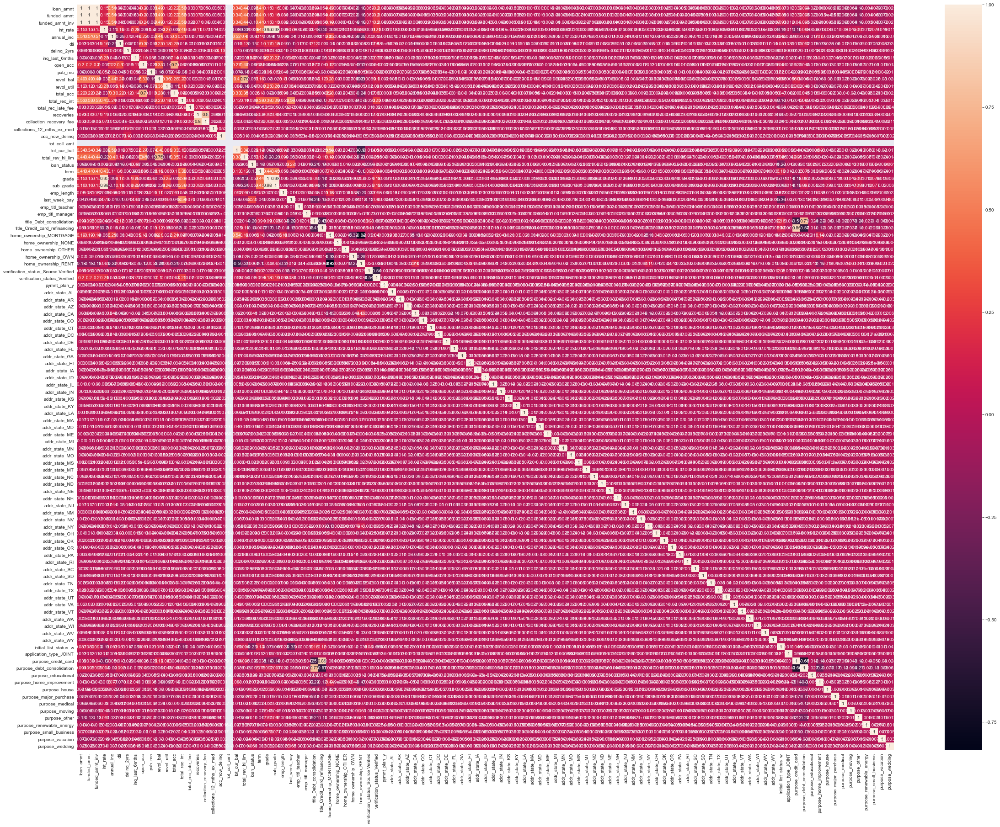

In [55]:
plt.figure(figsize=(40,30))
sns.heatmap(df_final.corr(),annot=True)

Most of the columns are not showing much correlation to the individual features.
Which may not be the case in realtime scenarios.

In [58]:
# Checking multicollinearity using VIF

import statsmodels.api as sm
features=list(df_final.columns)

Rsqr_Vif = []
for i in range(1, len(df_final.columns)):
    
    x=df_final.loc[:,df_final.columns!=features[i]]
    y=df_final.loc[:,df_final.columns==features[i]]
    model=sm.OLS(y,x)
    results=model.fit()

    rsq=results.rsquared
    vif=round(1/(1-rsq),2)
    
    Rsqr_Vif.append({'column':features[i],'Rsqr':rsq,'vif':vif})

rsq=pd.DataFrame(Rsqr_Vif)
rsq

,column,Rsqr,vif
0,funded_amnt,0.999761,4178.26
1,funded_amnt_inv,0.999119,1135.38
2,int_rate,0.997312,371.97
3,annual_inc,0.913791,11.60
4,dti,0.884870,8.69
...,...,...,...
99,purpose_other,-82.333658,0.01
100,purpose_renewable_energy,-3.148869,0.24
101,purpose_small_business,-1398.351523,0.00
102,purpose_vacation,-6.238503,0.14


In [52]:
df_final

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,annual_inc,dti,delinq_2yrs,inq_last_6mths,open_acc,pub_rec,...,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding
0,14350,14350,14350.0,19.19,28700.0,33.88,0.0,1.0,14.0,1.0,...,0,0,0,0,0,0,0,0,0,0
1,4800,4800,4800.0,10.99,65000.0,3.64,0.0,1.0,6.0,0.0,...,1,0,0,0,0,0,0,0,0,0
2,10000,10000,10000.0,7.26,45000.0,18.42,0.0,0.0,5.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,15000,15000,15000.0,19.72,105000.0,14.97,0.0,2.0,10.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,16000,16000,16000.0,10.64,52000.0,20.16,0.0,0.0,11.0,0.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
262423,20000,20000,20000.0,12.49,75000.0,14.53,0.0,0.0,12.0,1.0,...,0,0,0,0,0,0,0,0,0,0
262424,12000,12000,12000.0,14.99,59000.0,22.97,0.0,0.0,10.0,1.0,...,0,0,0,0,0,0,0,0,0,0
262425,18725,18725,18725.0,20.80,42504.0,27.27,0.0,1.0,14.0,0.0,...,0,0,0,0,0,0,0,0,0,0
262426,21000,21000,21000.0,16.29,50000.0,14.91,0.0,1.0,7.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [53]:
#Splitting the target feature from independent features

Y = df_final['loan_status']
df_final = df_final.drop(['loan_status'], axis = 1)

In [54]:
#Scaling the independent features before applying PCA

from sklearn.preprocessing import StandardScaler

scalar=StandardScaler()
scalar.fit(df_final)
scaled_df=scalar.transform(df_final)

In [57]:
#Fitting the scaled data in PCA

from sklearn.decomposition import PCA
pca=PCA()
PCA_result=pca.fit(scaled_df)
exp_var_pca = pca.explained_variance_ratio_
exp_var_pca


array([5.36247759e-02, 3.92968140e-02, 2.75078572e-02, 2.10053875e-02,
       1.94669948e-02, 1.73314574e-02, 1.69175087e-02, 1.52786609e-02,
       1.33619367e-02, 1.25672268e-02, 1.20098731e-02, 1.13958142e-02,
       1.09641493e-02, 1.08518386e-02, 1.05018692e-02, 1.03734220e-02,
       1.02589976e-02, 1.02372310e-02, 1.01947900e-02, 1.00959062e-02,
       1.00910976e-02, 1.00640985e-02, 1.00404179e-02, 1.00228302e-02,
       1.00106867e-02, 9.99106483e-03, 9.97338731e-03, 9.97272089e-03,
       9.95529005e-03, 9.93832422e-03, 9.93165359e-03, 9.91449964e-03,
       9.90998404e-03, 9.89804344e-03, 9.89035782e-03, 9.87247610e-03,
       9.87077098e-03, 9.86112309e-03, 9.85573758e-03, 9.85300553e-03,
       9.83700089e-03, 9.83239108e-03, 9.82475501e-03, 9.82139855e-03,
       9.81972864e-03, 9.81597799e-03, 9.79991528e-03, 9.79514313e-03,
       9.78396781e-03, 9.77952976e-03, 9.77652857e-03, 9.77167639e-03,
       9.76806517e-03, 9.76529488e-03, 9.75169177e-03, 9.74789064e-03,
      

In [58]:
cum_sum_eigenvalues = np.cumsum(exp_var_pca)
cum_sum_eigenvalues

array([0.05362478, 0.09292159, 0.12042945, 0.14143483, 0.16090183,
       0.17823329, 0.1951508 , 0.21042946, 0.22379139, 0.23635862,
       0.24836849, 0.25976431, 0.27072846, 0.2815803 , 0.29208216,
       0.30245559, 0.31271458, 0.32295181, 0.33314661, 0.34324251,
       0.35333361, 0.36339771, 0.37343813, 0.38346096, 0.39347164,
       0.40346271, 0.41343609, 0.42340882, 0.43336411, 0.44330243,
       0.45323408, 0.46314858, 0.47305857, 0.48295661, 0.49284697,
       0.50271944, 0.51259022, 0.52245134, 0.53230708, 0.54216008,
       0.55199708, 0.56182947, 0.57165423, 0.58147563, 0.59129536,
       0.60111133, 0.61091125, 0.62070639, 0.63049036, 0.64026989,
       0.65004642, 0.65981809, 0.66958616, 0.67935145, 0.68910315,
       0.69885104, 0.70859048, 0.71832601, 0.72805128, 0.73777346,
       0.74748907, 0.75719792, 0.76689851, 0.7765966 , 0.786286  ,
       0.79596982, 0.80564687, 0.81530983, 0.82495303, 0.83458488,
       0.84419294, 0.85376443, 0.86330554, 0.87279592, 0.88218

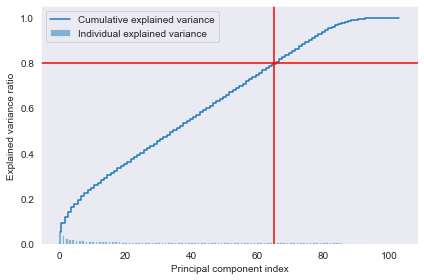

In [59]:
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.axhline(y=.8,color='r')
plt.axvline(x=65,color='r')
plt.tight_layout()
plt.show()

65 components provides 80% variance
Almost all the components provide significant variance to the dataset.
Which won't be the case in real time scenarios.

In [60]:
pca=PCA(n_components=65)
# finding the PCA
PCA_result=pca.fit(scaled_df)
x_pca=pca.fit_transform(scaled_df)
X_train=pd.DataFrame(x_pca) 


In [61]:
pd.DataFrame(PCA_result.components_)

,0,1,2,3,4,5,6,7,8,9,...,94,95,96,97,98,99,100,101,102,103
0,0.374452,0.374514,0.374226,0.111943,0.252633,0.070872,0.017006,0.023644,0.174174,-0.044965,...,0.002926,-0.004767,-0.033230,-0.025258,-0.030445,-0.057146,-0.006316,0.001451,-0.030109,-0.014858
1,-0.008473,-0.008749,-0.009571,0.431504,-0.151169,0.061252,0.018281,0.095944,-0.103941,0.044044,...,-0.035424,0.020084,-0.006702,0.012150,0.027343,0.047335,0.006617,0.037901,0.009558,0.010379
2,0.042296,0.041803,0.040312,0.139467,-0.024760,-0.034255,-0.030826,0.043331,-0.090821,-0.024877,...,0.049190,0.032403,0.037639,0.030431,0.036134,0.088857,0.011693,0.063677,0.020974,0.028636
3,-0.186837,-0.187643,-0.189516,0.079381,0.024949,-0.041879,0.093025,0.209480,0.078646,0.063619,...,0.254893,0.023867,0.058097,0.068102,0.017723,0.121123,0.015368,0.060889,0.043114,0.029735
4,-0.124961,-0.123637,-0.120276,0.142531,-0.147218,0.352994,0.093438,0.071713,0.278369,0.094960,...,-0.041643,-0.021582,-0.060420,0.017542,0.005022,0.008961,-0.007628,-0.066025,0.014387,-0.066087
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,0.003042,0.003098,0.003980,-0.004262,-0.042910,-0.001496,-0.021571,-0.072466,0.028232,0.032104,...,0.140538,-0.059000,-0.036895,0.085519,-0.194762,0.014642,-0.023567,-0.183462,0.127789,-0.161845
61,0.004775,0.004758,0.004367,-0.001965,-0.031187,0.035567,0.017718,-0.046708,-0.016537,-0.035623,...,0.041804,-0.063362,0.011028,-0.295725,0.160766,-0.000979,0.184491,0.126111,0.099213,-0.103037
62,0.011181,0.011325,0.012283,-0.008187,0.002151,-0.014696,-0.144411,-0.053721,0.035183,0.026498,...,0.053783,-0.079388,-0.094443,-0.015505,0.052672,0.055106,0.244577,-0.051868,0.000965,0.008822
63,-0.024522,-0.024665,-0.024816,0.018615,0.027312,-0.074871,-0.089636,0.050440,-0.022312,0.050451,...,-0.104966,-0.122987,-0.022047,-0.105319,0.115856,0.025410,0.010131,0.167158,0.058947,-0.064925


In [62]:
from sklearn.model_selection import train_test_split,cross_val_predict,cross_val_score
from sklearn.ensemble import RandomForestClassifier
# from pdpbox import pdp, get_dataset, info_plots
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix,roc_auc_score,roc_curve,classification_report,roc_curve,auc


random_state=42
np.random.seed(random_state)
import warnings
warnings.filterwarnings('ignore')

In [63]:
x_train,x_test,y_train,y_test=train_test_split(X_train,Y,test_size=0.3, random_state=1)

In [64]:
lr_model=LogisticRegression(random_state=42)
#fitting the model-
lr_model.fit(x_train,y_train)
lr_model.fit(x_test,y_test)

Train_score=lr_model.score(x_train,y_train)
Test_score=lr_model.score(x_test,y_test)

#Cross validation prediction of lr_model-
cv_predict=cross_val_predict(lr_model,x_test,y_test,cv=5)
#Cross validation score-
cv_score=cross_val_score(lr_model,x_test,y_test,cv=5)

#ROC_AUC SCORE:-
roc_score=roc_auc_score(y_test,cv_predict)

score=[]
score.append({'Train_accuracy':Train_score,'Test_accuracy':Test_score,'cross val score':np.average(cv_score),'ROC Score':roc_score})

scr=pd.DataFrame(score)
scr

,Train_accuracy,Test_accuracy,cross val score,ROC Score
0,0.787601,0.788248,0.787891,0.599759


In [65]:
#Confusion matrix:-
cm=confusion_matrix(y_test,cv_predict)
cm=pd.crosstab(y_test,cv_predict)
cm

col_0,0,1
loan_status,,
0,116667,5433
1,28447,9182


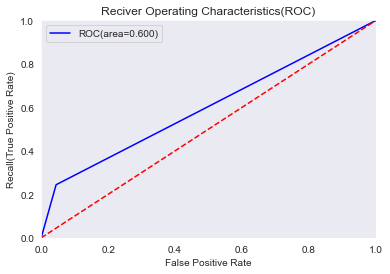

AUC: 0.59975880546677


In [66]:
#ROC_AUC_Curve:-
plt.figure()
false_positive_rate,recall,thresholds=roc_curve(y_test,cv_predict)
roc_auc=auc(false_positive_rate,recall)
plt.title('Reciver Operating Characteristics(ROC)')
plt.plot(false_positive_rate,recall,'b',label='ROC(area=%0.3f)' %roc_auc)
plt.legend()
plt.plot([0,1],[0,1],'r--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.0])
plt.ylabel('Recall(True Positive Rate)')
plt.xlabel('False Positive Rate')
plt.show()
print('AUC:',roc_auc)

In [67]:
#Classification report:-
classification_scores=classification_report(y_test,cv_predict)
print(classification_scores)

              precision    recall  f1-score   support

           0       0.80      0.96      0.87    122100
           1       0.63      0.24      0.35     37629

    accuracy                           0.79    159729
   macro avg       0.72      0.60      0.61    159729
weighted avg       0.76      0.79      0.75    159729



On comparing roc_auc_score and model accuracy, model is not performing well on imbalanced data.
f1 score is high for the customers who will not make a transaction, compared to those who will make a transaction.
In order to overcome this we need to do SMOT.

In [68]:
import imblearn
from imblearn.over_sampling import SMOTE
#SMOTE:-
sm = SMOTE(random_state=42)
#Generating synthetic data points
x_smote_Train,y_smote_Train=sm.fit_resample(x_train,y_train)
x_smote_Test,y_smote_Test=sm.fit_resample(x_test,y_test)

In [70]:
lr_model=LogisticRegression(random_state=42)
#fitting the model-
lr_model.fit(x_smote_Train,y_smote_Train)
lr_model.fit(x_smote_Test,y_smote_Test)

LogisticRegression(random_state=42)

In [71]:
#Accuracy of model-
Train_score=lr_model.score(x_smote_Train,y_smote_Train)
Test_score=lr_model.score(x_smote_Test,y_smote_Test)

#Cross validation prediction of lr_model-
cv_predict=cross_val_predict(lr_model,x_smote_Test,y_smote_Test,cv=5)
#Cross validation score-
cv_score=cross_val_score(lr_model,x_smote_Test,y_smote_Test,cv=5)

#ROC_AUC SCORE:-
roc_score=roc_auc_score(y_smote_Test,cv_predict)

score=[]
score.append({'Train_accuracy':Train_score,'Test_accuracy':Test_score,'cross val score':np.average(cv_score),'ROC Score':roc_score})

scr=pd.DataFrame(score)
scr

,Train_accuracy,Test_accuracy,cross val score,ROC Score
0,0.685126,0.688493,0.688407,0.688407


In [72]:
#Confusion matrix:-
cm=confusion_matrix(y_smote_Test,cv_predict)
cm=pd.crosstab(y_smote_Test,cv_predict)
cm

col_0,0,1
loan_status,,
0,85907,36193
1,39898,82202


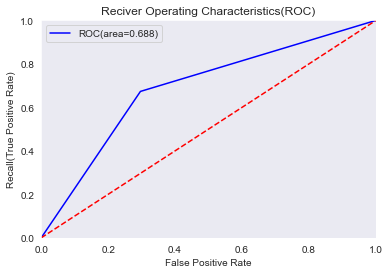

AUC: 0.6884070434070434


In [73]:
#ROC_AUC_Curve:-
plt.figure()
false_positive_rate,recall,thresholds=roc_curve(y_smote_Test,cv_predict)
roc_auc=auc(false_positive_rate,recall)
plt.title('Reciver Operating Characteristics(ROC)')
plt.plot(false_positive_rate,recall,'b',label='ROC(area=%0.3f)' %roc_auc)
plt.legend()
plt.plot([0,1],[0,1],'r--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.0])
plt.ylabel('Recall(True Positive Rate)')
plt.xlabel('False Positive Rate')
plt.show()
print('AUC:',roc_auc)

In [74]:
#Classification report:-
classification_scores=classification_report(y_smote_Test,cv_predict)
print(classification_scores)

              precision    recall  f1-score   support

           0       0.68      0.70      0.69    122100
           1       0.69      0.67      0.68    122100

    accuracy                           0.69    244200
   macro avg       0.69      0.69      0.69    244200
weighted avg       0.69      0.69      0.69    244200



All the Training & Testing accuracy, CV score and ROC score is 69%.
We can see the AUC is also at 69.
f1 score of 69 is same for both type of the customers.